
# Enunciado

El conjunto de datos contiene información sobre casi 18000 inmuebles de la localidad de Madrid. Se pide construir un modelo para predecir el precio de los inmuebles a partir del resto de variables.

En el proceso de construcción del modelo predictivo se piden explícitamente estas acciones:
1. Entendimiento de los datos (EDA)
2. Preparación de los datos (preprocesado de los datos, imputación de nulos, análisis de valores atípicos)
3. Creación de nuevas variables de interés (feature engineering)
4. Planteamiento del modelo (o modelos)
5. Evaluación de resultados (elección de las métricas adecuadas)

PD: La búsqueda de la perfección no tiene fin, y hay innumerables formas de abordar esta tarea. Sin embargo, hay que intentar no enfocarlo como una competición para conseguir la mayor precisión posible. Lo que importa es la secuencia y el proceso de pensamiento: ¡muéstralo en las ilustraciones y los comentarios! Incluso si ciertas cosas pueden ser demasiado largas de implementar en un código, pero tienes una buena idea de hacia dónde ir con esto, ¡escribe tus ideas! Esto es lo que importa. En general, intenta no dedicar más de unas horas a esto.

Descripción de la nomenclatura de los prefijos del conjunto de datos:

- INM: datos propios del inmueble
- HIS: datos históricos de la evolución de precios por barrio
- DEM: datos sociodemográficos por barrio

Variable objetivo regresión: inm_price


In [1]:
#import rtree
#import pygeos
#import geopandas
#from geopandas import GeoDataFrame
#from shapely import wkt
#from shapely.geometry import Point
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib import cm
%matplotlib inline

# Carga de datos

In [2]:
dir_archivo = r'C:\Users\slopezgu\OneDrive - Capgemini\Desktop\Ejercicio AIA\reg_dataset.csv'
df = pd.read_csv(dir_archivo, sep=',')
dfinicial = df.copy()
print(df.shape)
df.head()

(17857, 25)


,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,inm_barrio,inm_distrito,his_price,his_quarterly_variation,his_annual_variation,...,dem_TasaDeParo,dem_TamanoMedioDelHogar,dem_PropSinEstudiosUniversitarios,dem_PropSinEstudios,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PropConEstudiosUniversitarios,dem_PobTotal,dem_NumViviendas,dem_EdadMedia,dem_Densidad_(Habit/Ha)
0,3.0,141.0,990000.0,-3.656875,40.464347,Canillas,Hortaleza,3250,2.2,0.3,...,8.724674,2.527886,0.488949,0.175632,15.456193,NaN,40838,16155.0,NaN,161.894356
1,2.0,159.0,940000.0,-3.703523,40.419427,Universidad,Centro,5106,1.4,-4.3,...,9.006094,1.975877,0.386598,0.083812,32.102460,0.529590,33418,16913.0,43.678945,352.500616
2,NaN,NaN,549000.0,-3.669626,40.435362,Guindalera,Salamanca,4100,0.6,-4.1,...,7.441379,2.369951,0.365818,0.070351,18.224365,0.563831,42306,17851.0,46.477166,263.952286
3,2.0,232.0,750000.0,-3.720619,40.424164,Argüelles,Moncloa - Aravaca,4773,0.5,-3.7,...,6.709633,2.328217,0.343683,0.066403,20.963846,0.589914,24423,10490.0,46.972342,322.402577
4,4.0,183.0,1550000.0,-3.705909,40.413214,Sol,Centro,4739,-5.5,-5.3,...,9.058980,1.994244,0.433750,0.082242,39.490947,0.484009,7622,3822.0,44.632774,171.165183


# 1 EDA


In [3]:
df.describe()
#Todo variables numéricas menos barrio y distrito

,inm_floor,inm_size,inm_price,inm_longitude,inm_latitude,his_price,his_quarterly_variation,his_annual_variation,his_monthly_variation,dem_Indice_de_reemplazo_de_la_poblacion_activa,...,dem_TasaDeParo,dem_TamanoMedioDelHogar,dem_PropSinEstudiosUniversitarios,dem_PropSinEstudios,dem_Proporcion_de_nacidos_fuera_de_Espana,dem_PropConEstudiosUniversitarios,dem_PobTotal,dem_NumViviendas,dem_EdadMedia,dem_Densidad_(Habit/Ha)
count,14067.000000,16090.000000,1.785700e+04,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,...,17857.000000,17857.000000,17857.000000,17857.000000,17857.000000,16132.000000,17857.000000,17857.000000,16067.000000,17857.000000
mean,2.696453,149.013753,6.964702e+05,-3.688064,40.424817,3993.643389,0.437918,-1.814499,0.035549,58.387524,...,8.736896,2.487494,0.436518,0.124281,24.851753,0.439830,28281.995296,11515.008960,44.315032,233.372820
std,2.387135,160.485808,8.547274e+05,0.039164,0.031176,1589.895597,2.510048,3.847875,1.533065,23.241554,...,3.042722,0.300608,0.109068,0.076923,8.542049,0.181168,13117.299282,5322.072109,2.842113,122.653928
min,-1.000000,8.000000,1.600000e+04,-3.837697,40.328140,1290.000000,-16.100000,-11.600000,-5.200000,26.976744,...,3.643735,1.975877,0.246480,0.036422,8.884988,0.072421,2398.000000,872.000000,33.198916,2.267773
25%,1.000000,66.000000,1.899000e+05,-3.708170,40.402633,2578.000000,-1.100000,-4.300000,-0.600000,41.889843,...,6.291480,2.297491,0.340818,0.062095,18.746056,0.257582,18785.000000,8011.000000,43.161070,155.641754
50%,2.000000,98.000000,3.700000e+05,-3.692498,40.426586,4049.000000,0.500000,-2.200000,0.000000,51.910341,...,8.076921,2.466320,0.391468,0.085268,23.400147,0.512828,25023.000000,10637.000000,45.113343,228.165728
75%,4.000000,166.000000,8.490000e+05,-3.669516,40.446864,5106.000000,1.900000,-0.100000,0.900000,65.111111,...,10.802359,2.673612,0.551965,0.191202,31.219133,0.592631,36922.000000,15312.000000,46.244228,322.402577
max,60.000000,2400.000000,1.500000e+07,-3.545674,40.507659,8299.000000,12.200000,17.200000,8.100000,171.272727,...,18.030112,3.506552,0.641264,0.355659,53.296248,0.699977,67418.000000,26836.000000,49.332035,460.612389


We see that the mean and median of the price are far apart, which can give us an idea of what is happening: the distribution of the variable is not normal, but skewed to the left. We'll deep on it in advance.

In [4]:
df.describe(include=['object'])

,inm_barrio,inm_distrito
count,16063,16110
unique,121,21
top,Goya,Salamanca
freq,479,2064


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17857 entries, 0 to 17856
Data columns (total 25 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   inm_floor                                        14067 non-null  float64
 1   inm_size                                         16090 non-null  float64
 2   inm_price                                        17857 non-null  float64
 3   inm_longitude                                    17857 non-null  float64
 4   inm_latitude                                     17857 non-null  float64
 5   inm_barrio                                       16063 non-null  object 
 6   inm_distrito                                     16110 non-null  object 
 7   his_price                                        17857 non-null  int64  
 8   his_quarterly_variation                          17857 non-null  float64
 9   his_annual_variation        

> Check Duplicates

Let's check for duplicates. As there is no ID to help us with the task, we are going to check if more than one record exists for a particular location by looking at its longitude, latitude, size, floor, district and neighbourhood. In Datasets related to the housing market it is common for the price of a home to be changed, which can cause data to be overwritten. In case of duplicates, we will keep the last record as we will consider it to be the most complete.

In [6]:
 df = df.drop_duplicates(subset=['inm_longitude', 'inm_latitude', 'inm_floor', 'inm_size', 'inm_price',
       'inm_barrio', 'inm_distrito'], keep='last')
df.shape

(17851, 25)

Our sample has decreased by 25 units

# 2 Data preparation

## Null values

In [7]:
nulls = pd.DataFrame(df[df.columns[df.isnull().any()]].isnull().sum())
nulls['Percentage'] = df[df.columns[df.isnull().any()]].isnull().sum() / df.shape[0]
nulls = nulls.rename(columns={0: 'nulls'})
nulls.head(10)

,nulls,Percentage
inm_floor,3790,0.212313
inm_size,1766,0.098930
inm_barrio,1794,0.100499
inm_distrito,1747,0.097866
dem_PropConEstudiosUniversitarios,1725,0.096633
dem_EdadMedia,1790,0.100274


There are a considerable number of nulls. It is worrying in variables such as size, the keys will potentially be very important in predicting the price. Therefore, we will fill in the nulls of the ENTIRE DATASET with the average per neighbourhood. For those numerical variables, we will fill it with the mode.

In [8]:
# Iterar sobre las columnas del DataFrame
for column in df.columns:
    # Verificar si la columna tiene valores nulos
    if df[column].isnull().any():
        # Si la columna tiene valores numéricos, calcular la mediana por categoría y llenar los valores nulos
        if pd.api.types.is_numeric_dtype(df[column]):
            median_by_hood = df.groupby('inm_barrio')[column].median()
            median_by_district = df.groupby('inm_distrito')[column].median()
            
            # Si hay datos en el vecindario, usar la mediana del vecindario; de lo contrario, usar la mediana del distrito
            df[column] = df[column].fillna(df['inm_barrio'].map(median_by_hood).combine_first(df['inm_distrito'].map(median_by_district)))
        # Si la columna no es numérica, llenar los valores nulos con la moda
        else:
            mode_value = df[column].mode().iloc[0]
            df[column] = df[column].fillna(mode_value)



When addressing missing values, I implemented a strategy initially calculating the median of these variables by neighborhood. Recognizing the absence of data in certain neighborhoods, I optimized the process by using the district's median for those lacking data. This approach combines imputation based on local trends with the robustness of the median, ensuring better representation in the absence of specific information. The adaptability of the strategy contributes to more precise and consistent imputation, particularly in the presence of outliers, where the median is more resistant to extreme values.

In [9]:
nulls = pd.DataFrame(df[df.columns[df.isnull().any()]].isnull().sum())
nulls['Percentage'] = df[df.columns[df.isnull().any()]].isnull().sum() / df.shape[0]
nulls = nulls.rename(columns={0: 'nulls'})
nulls.head()

,nulls,Percentage
inm_floor,40,0.002241
inm_size,23,0.001288


In [10]:
# Drop rows with null values
df = df.dropna()
print(df.shape)

(17795, 25)


# Target Variable Distribution

C:\Users\slopezgu\AppData\Local\Temp\ipykernel_2088\2532373966.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['inm_price'], color='g', bins=100, hist_kws={'alpha': 0.4})


<Axes: xlabel='inm_price', ylabel='Density'>

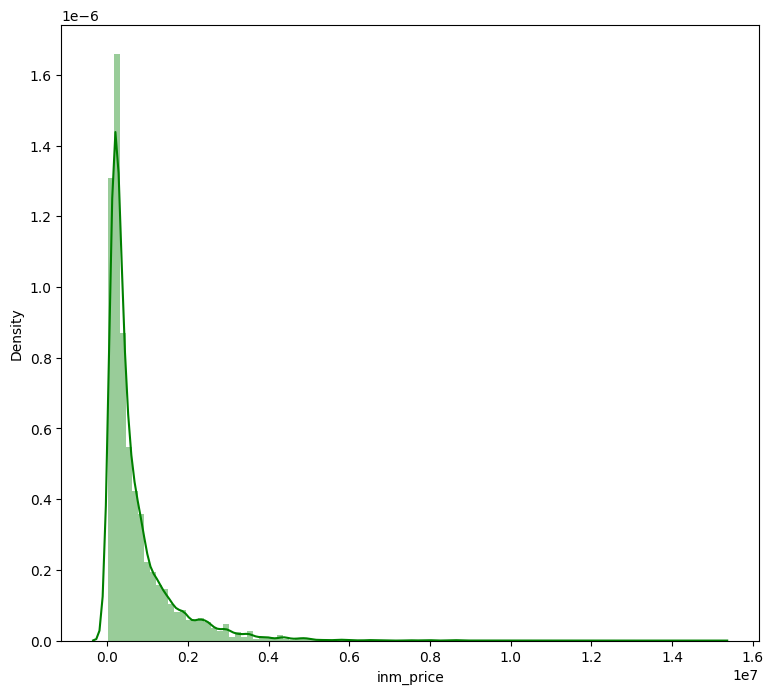

In [11]:
plt.figure(figsize=(9, 8))
sns.distplot(df['inm_price'], color='g', bins=100, hist_kws={'alpha': 0.4})

array([[<Axes: title={'center': 'inm_floor'}>,
        <Axes: title={'center': 'inm_size'}>,
        <Axes: title={'center': 'inm_price'}>,
        <Axes: title={'center': 'inm_longitude'}>,
        <Axes: title={'center': 'inm_latitude'}>],
       [<Axes: title={'center': 'his_price'}>,
        <Axes: title={'center': 'his_quarterly_variation'}>,
        <Axes: title={'center': 'his_annual_variation'}>,
        <Axes: title={'center': 'his_monthly_variation'}>,
        <Axes: title={'center': 'dem_Indice_de_reemplazo_de_la_poblacion_activa'}>],
       [<Axes: title={'center': 'dem_Indice_de_juventud'}>,
        <Axes: title={'center': 'dem_Indice_de_estructura_de_la_poblacion_activa'}>,
        <Axes: title={'center': 'dem_Indice_de_dependencia'}>,
        <Axes: title={'center': 'dem_TasaDeParo'}>,
        <Axes: title={'center': 'dem_TamanoMedioDelHogar'}>],
       [<Axes: title={'center': 'dem_PropSinEstudiosUniversitarios'}>,
        <Axes: title={'center': 'dem_PropSinEstudios'}>

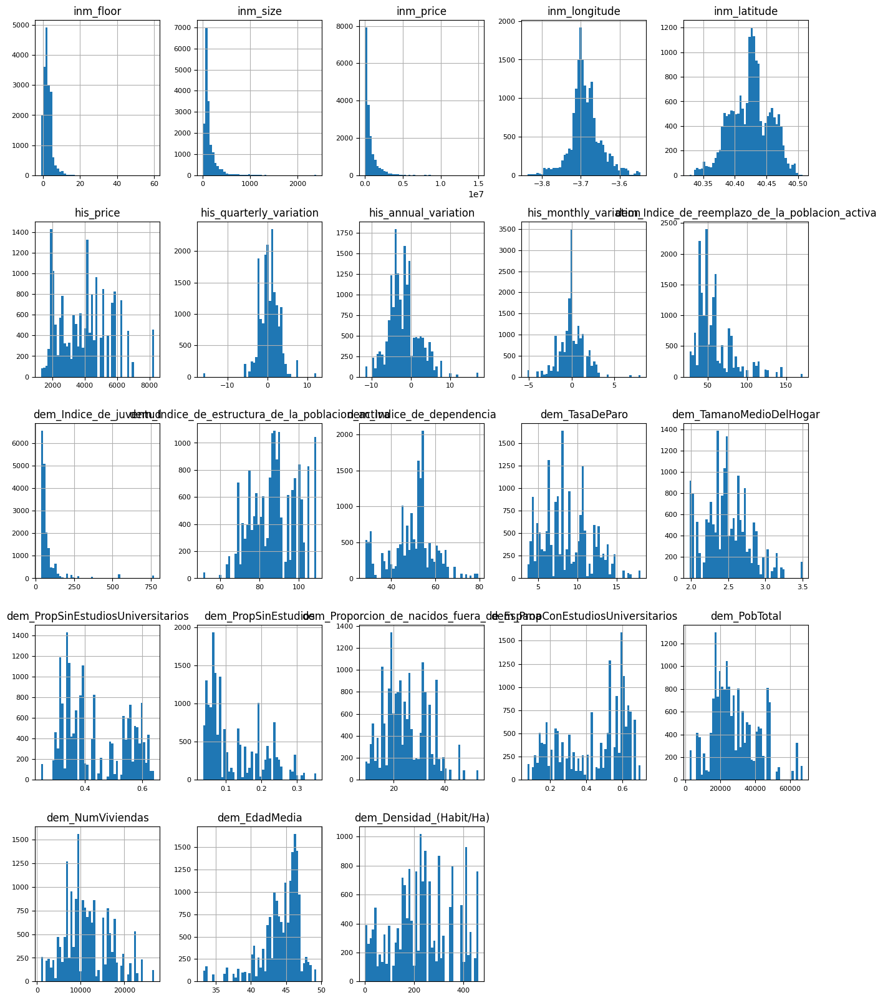

In [12]:
df_num = df.select_dtypes(include = ['float64', 'int64'])
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

We can confirm that size, price and floor are skewed to the left. This might happen cause, even most houses lay in a fix range of values, we have some extraordinary houses with huge prices, size and floor number. Later, I will study the outliers and decide what to do with them, depending also on the relationship between the variables and the number of nulls for each variable. Let´s check the boxplots of the main variables

The Population proportion with University Studies has a bimodal distribution, which means that there are two kinds of neighbourhoods, those with a high amount of graduates and some with lower ammount, and not many neighbourhoods in the middle.

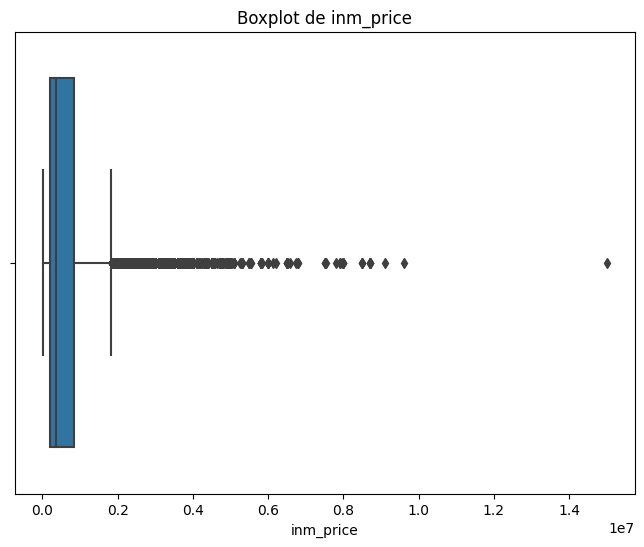

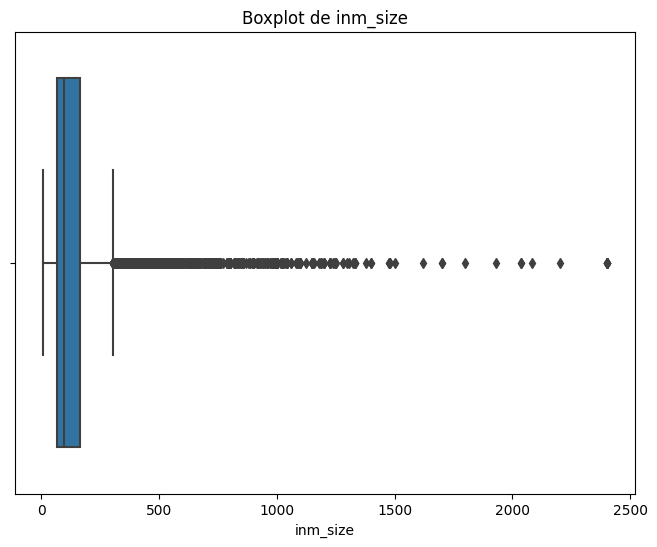

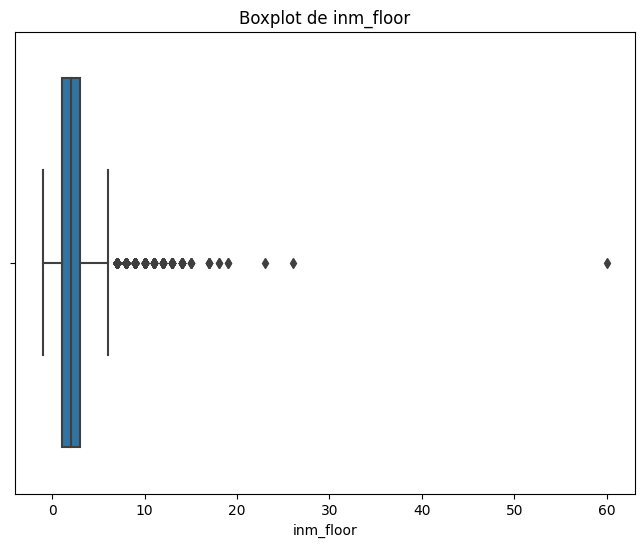

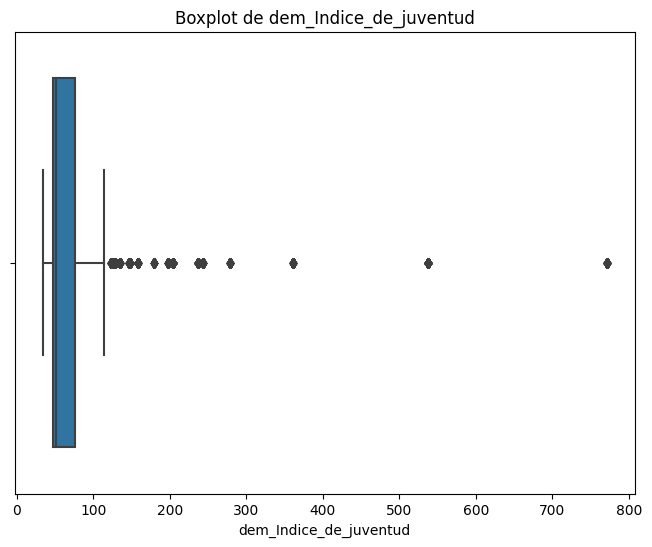

In [13]:
columnas_interes = ['inm_price', 'inm_size', 'inm_floor', 'dem_Indice_de_juventud']

# Crear boxplots para cada columna en la lista
for columna in columnas_interes:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[columna])
    plt.title(f'Boxplot de {columna}')
    plt.show()


There are definitely a number of outliers in price, size and floor. Also in the youth index. Let's study the outliers

In [14]:
# Seleccionar solo las columnas numéricas
numerical_data = df.select_dtypes(include=[np.number])

# Calcular el IQR para cada columna numérica
Q1 = numerical_data.quantile(0.25)
Q3 = numerical_data.quantile(0.75)
IQR = Q3 - Q1

# Definir límites para detectar outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identificar outliers
outliers = ((numerical_data < lower_bound) | (numerical_data > upper_bound)).sum()

outliers_df = pd.DataFrame({'Lower Bound': lower_bound, 'Upper Bound': upper_bound, 'Outliers': outliers})
outliers_df[outliers_df['Outliers'] > 0]  # Mostrar solo columnas con outliers

,Lower Bound,Upper Bound,Outliers
inm_floor,-2.000000,6.000000e+00,886
inm_size,-74.500000,3.055000e+02,1628
inm_price,-798750.000000,1.837650e+06,1578
inm_longitude,-3.766074,-3.611664e+00,1284
inm_latitude,40.336405,4.051301e+01,2
his_quarterly_variation,-5.725000,6.475000e+00,373
his_annual_variation,-10.600000,6.200000e+00,567
his_monthly_variation,-2.850000,3.150000e+00,681
dem_Indice_de_reemplazo_de_la_poblacion_activa,7.057942,9.994301e+01,1251
dem_Indice_de_juventud,3.477292,1.194339e+02,1850


In [15]:
columnas_numericas_para_outliers = df.select_dtypes(include=[np.number]).columns

for col in columnas_numericas_para_outliers:
    mean_with_outliers = df[col].mean()
    mean_without_outliers = df[col][df[col].between(df[col].quantile(0.05), df[col].quantile(0.95))].mean()
    print(f"Media de {col} con outliers: {mean_with_outliers}")
    print(f"Media de {col} sin outliers: {mean_without_outliers}")

Media de inm_floor con outliers: 2.579853891542568
Media de inm_floor sin outliers: 2.2753825998928123
Media de inm_size con outliers: 147.1387344759764
Media de inm_size sin outliers: 125.04046456594843
Media de inm_price con outliers: 696121.8338297275
Media de inm_price sin outliers: 575086.2481770022
Media de inm_longitude con outliers: -3.6880650211744874
Media de inm_longitude sin outliers: -3.6883601072307215
Media de inm_latitude con outliers: 40.42480397394211
Media de inm_latitude sin outliers: 40.42527597513581
Media de his_price con outliers: 3995.105928631638
Media de his_price sin outliers: 3964.4977392154465
Media de his_quarterly_variation con outliers: 0.43697667884237146
Media de his_quarterly_variation sin outliers: 0.49080354414909866
Media de his_annual_variation con outliers: -1.8166170272548472
Media de his_annual_variation sin outliers: -1.9414575497872866
Media de his_monthly_variation con outliers: 0.035420061815116616
Media de his_monthly_variation sin outlie

Most variables are greatly affected by the treatment of outliers, changing their distribution quite a bit. 
 Due to this large impact, I decide to continue without addressing the outliers until later in the data pre-processing. Once I´ve cheked data distribution, null values and correlation, I will consider what fields to keep and which to drop, also setting and upper and lower Bounds.

*Relation between variables

Once we have made an approach to our dataframe, we are in the position to work in our variables in order to make a better and simpler model. Let´s start dropping those variables whose information is almost duplicated

C:\Users\slopezgu\AppData\Local\Temp\ipykernel_2088\1639785998.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()  # Puedes usar df.corr() para variables numéricas


<Axes: >

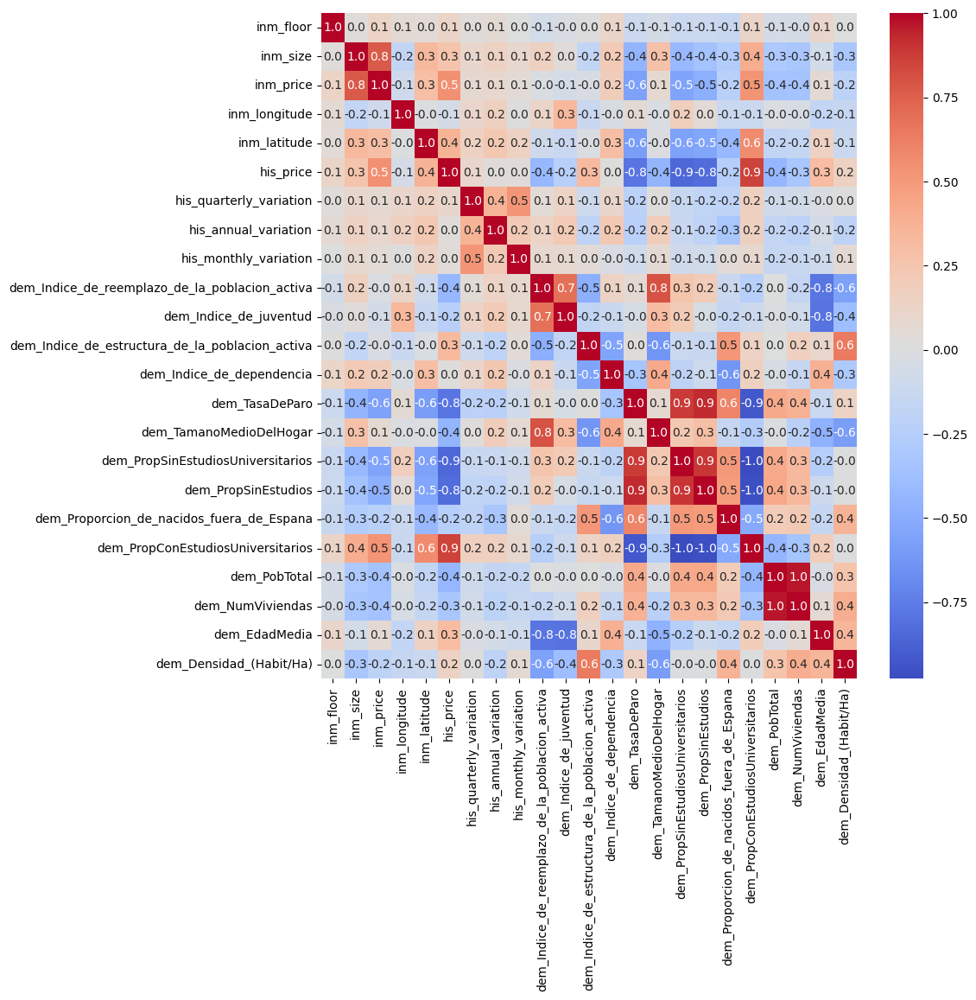

In [16]:
correlation_matrix = df.corr()  # Puedes usar df.corr() para variables numéricas

# Configura el tamaño de la figura
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".1f")

Strong positive correlations: inm_size, inm_price, dem_Indice_de_reemplazo_de_la_poblacion_activa, dem_TamanoMedioDelHogar

Strong negative correlations: inm_price y dem_TasadeParo, dem_PropSinEstudiosUniversitarios y dem_PropConEstudiosUniversitarios


Multicollinearity: 
- dem_TasaDeParo~dem_PropSinEstudiosUniversitarios~ dem_PropSinEstudios
- his_quarterly_variation, his_annual_variation, his_monthly_variation
- dem_Indice_de_reemplazo_de_la_poblacion_activa, dem_Indice_de_juventud, dem_Indice_de_dependencia, y dem_TasaDeParo

It is also necessary to analyse the effects neighbourhood and district, as it is assumed that both give almost the same information as latitude and longitude. We´ll come back to this

Let´s plot the relation between some of our variables

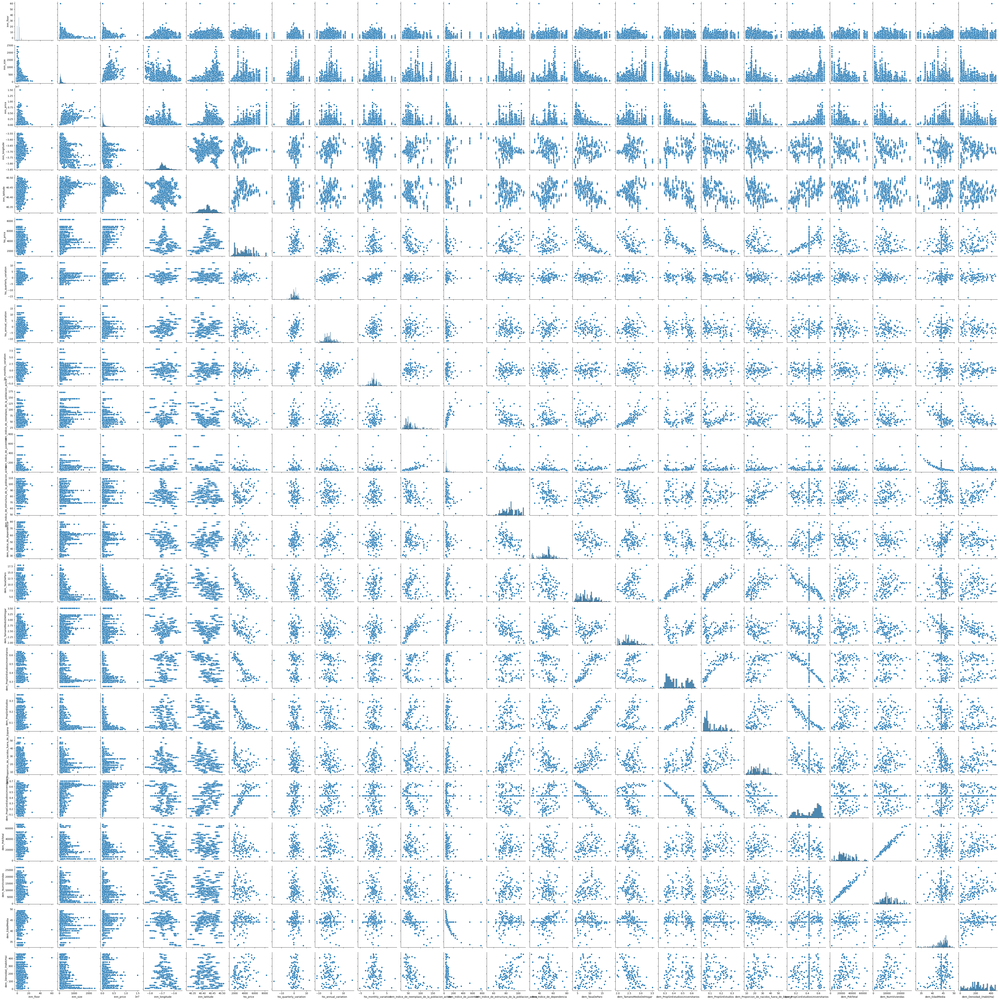

In [17]:


# Create scatter plots for all numeric variables using seaborn
sns.pairplot(df_num)
plt.show()


Wow! There is a great ammount of variables that present some kind of alingment. Taking into account the high correlation and the relation, it might be a good idea to calculate the VIF.

The VIF quantifies how much the variance of a regression coefficient increases due to multicollinearity. In simple terms, a high VIF indicates that the variance of a coefficient estimate is large, implying greater uncertainty in the interpretation of the relationship of that variable to the dependent variable.

A VIF is typically calculated for each predictor variable in a model, and a high value (e.g. greater than 10) suggests the presence of significant multicollinearity, which may require the modeller's attention to improve the quality of the model.

In [18]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Selecciona solo las columnas numéricas excluyendo la variable objetivo
numeric_columns = df.select_dtypes(include=['float64']).drop('inm_price', axis=1).columns

# Calcula el VIF para cada variable
vif_data = pd.DataFrame()
vif_data["Variable"] = numeric_columns
vif_data["VIF"] = [variance_inflation_factor(df[numeric_columns].values, i) for i in range(len(numeric_columns))]

# Muestra la tabla de VIF
print(vif_data)


                                           Variable           VIF
0                                         inm_floor      2.544274
1                                          inm_size      3.036712
2                                     inm_longitude  11554.712338
3                                      inm_latitude  18734.255174
4                           his_quarterly_variation      1.751898
5                              his_annual_variation      1.747129
6                             his_monthly_variation      1.574744
7    dem_Indice_de_reemplazo_de_la_poblacion_activa     76.354841
8                            dem_Indice_de_juventud     15.501616
9   dem_Indice_de_estructura_de_la_poblacion_activa    248.780589
10                        dem_Indice_de_dependencia    175.650062
11                                   dem_TasaDeParo    161.380432
12                          dem_TamanoMedioDelHogar    707.105905
13                dem_PropSinEstudiosUniversitarios    863.873063
14        

Upon analyzing the Variance Inflation Factor (VIF) results for the numeric variables in your dataset:

1. **Low VIF:**
   - 'inm_floor' and 'inm_size' exhibit relatively low VIF, indicating low multicollinearity.

2. **Huge VIF:**
   - 'inm_longitude' and 'inm_latitude' display extremely high VIF, suggesting substantial multicollinearity, possibly due to strong spatial correlation or redundant information.

3. **Demographic Variables:**
   - Several demographic variables show high VIF, indicating significant multicollinearity. 

In summary, addressing multicollinearity, particularly in demographic and geographic variables, will improve model stability and interpretability. Consider detailed analyses and techniques like variable elimination or dimensionality reduction as needed.

# 3 Feature engineering

1 Drop variables that do not provide any info

2 Drop outliers

3 PCA with some highly correlated variables

4 Location issue: are we going to use neighbourhood or latitude/longitude?

First, I will drop 'dem_PropSinEstudiosUniversitarios' and 'dem_PropSinEstudios' , as they provide the same info as 'dem_PropConEstudiosUniversitarios'. We will also drop 'dem_Indice_de_juventud', as it has almost the same info as 'dem_Indice_de_reemplazo_de_la_poblacion_activa', but with many more outliers

In [19]:
df = df.drop(['dem_PropSinEstudiosUniversitarios', 'dem_PropSinEstudios', 'dem_Indice_de_juventud'], axis=1)

In [20]:
# Seleccionar solo las columnas numéricas
numerical_data = df.select_dtypes(include = ['float64', 'int64'])

# Calcular el IQR para cada columna numérica
Q1 = numerical_data.quantile(0.25)
Q3 = numerical_data.quantile(0.75)
IQR = Q3 - Q1

# Definir límites para detectar outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identificar outliers
outliers = ((numerical_data < lower_bound) | (numerical_data > upper_bound)).sum()

outliers_df = pd.DataFrame({'Lower Bound': lower_bound, 'Upper Bound': upper_bound, 'Outliers': outliers})
outliers_df[outliers_df['Outliers'] > 0]  # Mostrar solo columnas con outliers

,Lower Bound,Upper Bound,Outliers
inm_floor,-2.000000,6.000000e+00,886
inm_size,-74.500000,3.055000e+02,1628
inm_price,-798750.000000,1.837650e+06,1578
inm_longitude,-3.766074,-3.611664e+00,1284
inm_latitude,40.336405,4.051301e+01,2
his_quarterly_variation,-5.725000,6.475000e+00,373
his_annual_variation,-10.600000,6.200000e+00,567
his_monthly_variation,-2.850000,3.150000e+00,681
dem_Indice_de_reemplazo_de_la_poblacion_activa,7.057942,9.994301e+01,1251
dem_Indice_de_estructura_de_la_poblacion_activa,52.070046,1.233006e+02,44


We drop outliers

In [21]:
outliers_mask = ((numerical_data < lower_bound) | (numerical_data > upper_bound))
df_no_outliers = df[~outliers_mask.any(axis=1)]

# Visualizar el nuevo DataFrame sin outliers
print(df.shape)
print(df_no_outliers.shape)

(17795, 22)
(11774, 22)


This is too many drops! We loose our choice and we will just drop those values out of the first and the last 15 percentile

In [22]:
numerical_data = df.select_dtypes(include = ['float64', 'int64'])

# Calcular el IQR para cada columna numérica
Q1 = numerical_data.quantile(0.15)
Q3 = numerical_data.quantile(0.85)
IQR = Q3 - Q1

# Definir límites para detectar outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identificar outliers
outliers = ((numerical_data < lower_bound) | (numerical_data > upper_bound)).sum()

outliers_df = pd.DataFrame({'Lower Bound': lower_bound, 'Upper Bound': upper_bound, 'Outliers': outliers})
outliers_df[outliers_df['Outliers'] > 0]  # Mostrar solo columnas con outliers

,Lower Bound,Upper Bound,Outliers
inm_floor,-3.500000e+00,8.500000e+00,357
inm_size,-2.040000e+02,4.920000e+02,566
inm_price,-1.562500e+06,3.001500e+06,445
inm_longitude,-3.816146e+00,-3.552961e+00,92
his_quarterly_variation,-9.200000e+00,1.000000e+01,113
his_annual_variation,-1.675000e+01,1.405000e+01,53
his_monthly_variation,-5.200000e+00,5.200000e+00,88
dem_Indice_de_reemplazo_de_la_poblacion_activa,-1.924831e+01,1.387132e+02,199
dem_EdadMedia,3.432875e+01,5.406800e+01,287


In [23]:
outliers_mask = ((numerical_data < lower_bound) | (numerical_data > upper_bound))
df_no_outliers = df[~outliers_mask.any(axis=1)]

# Visualizar el nuevo DataFrame sin outliers
print(df.shape)
print(df_no_outliers.shape)

(17795, 22)
(16061, 22)


Much better!

In [24]:
df = df_no_outliers

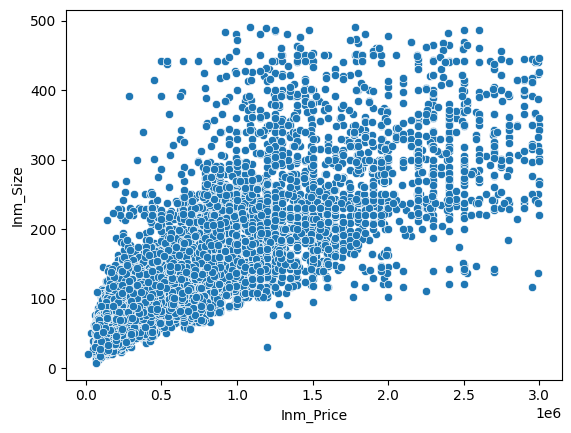

In [25]:
sns.scatterplot(data=df, x='inm_price', y='inm_size')
plt.xlabel('Inm_Price')
plt.ylabel('Inm_Size')
plt.show()

Good enough! Let´s go for the PCA. In this case, we will use PCA with all the demographic variables:

In [26]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Selecciona las variables relevantes
variables_relevantes = ['dem_Indice_de_reemplazo_de_la_poblacion_activa',
       'dem_Indice_de_estructura_de_la_poblacion_activa',
       'dem_Indice_de_dependencia', 'dem_TasaDeParo',
       'dem_TamanoMedioDelHogar',
       'dem_Proporcion_de_nacidos_fuera_de_Espana',
       'dem_PropConEstudiosUniversitarios', 'dem_PobTotal']

# Normaliza las variables
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[variables_relevantes])

# Aplica PCA
pca = PCA()
df_pca = pca.fit_transform(df_scaled)

# Muestra la proporción de varianza explicada
print(pca.explained_variance_ratio_)


[0.37551186 0.34022575 0.11947234 0.07603374 0.05111286 0.02139894
 0.01115446 0.00509004]


The results of the PCA on the selected demographic variables indicate that the first two principal components explain a significant portion of the variance in the data. Specifically:

- The first principal component (PC1) captures approximately 37.5% of the variance.
- The second principal component (PC2) accounts for about 34.0% of the variance.

Together, these two components explain a substantial proportion (around 71.5%) of the overall variance. The diminishing percentages for subsequent components suggest decreasing contributions to the overall variance. This reduction in dimensionality can aid in retaining essential information while simplifying the dataset's representation.

We will add those two PCA in order to use it later in our model:

In [27]:
# Añadir los componentes principales al DataFrame original
df['PCA1'] = df_pca[:, 0]
df['PCA2'] = df_pca[:, 1]


 Analysis by neighbourhood

In [28]:
# Número de valores únicos en la columna 'inm_barrio' e 'inm_distrito'
n_distinct_barrios = df['inm_barrio'].nunique()
n_distinct_distritos = df['inm_distrito'].nunique()

print("Número de barrios:", n_distinct_barrios)
print("Número de distritos:", n_distinct_distritos)

Número de barrios: 114
Número de distritos: 21


The number of districts has decreased. This could be due to the fact that all outliers fell in the same districts. With a deeper and more ambitious analysis, we could try to look further into this event to complement our model.

Let´s check which are the most expensive neighbourhoods by squared metter

In [29]:
df['m2price']= df['inm_price']/	df['inm_size']

In [30]:
groupedby_hood = df.groupby('inm_barrio')
groupedby_district = df.groupby('inm_distrito')

# Calculate the average house price for each neighbourhood
hood_prices = groupedby_hood['m2price'].mean().sort_values(ascending=False)
dist_prices = groupedby_district['m2price'].mean().sort_values(ascending=False)

print('Those are the most expensive neighbourhoods:')
print(hood_prices.head())
print('Those are the least expensive neighbourhoods:')
print(hood_prices.tail())
print('Those are the most expensive districts:')
print(dist_prices.head())
print('Those are the least expensive districts:')
print(dist_prices.tail())

Those are the most expensive neighbourhoods:
inm_barrio
Recoletos     8235.329362
Almagro       7032.201984
Castellana    6962.286638
Jerónimos     6817.816654
Lista         6644.034297
Name: m2price, dtype: float64
Those are the least expensive neighbourhoods:
inm_barrio
Los Ángeles      1876.758442
Amposta          1814.052444
Orcasitas        1761.946783
Entrevías        1638.758580
San Cristóbal    1392.182169
Name: m2price, dtype: float64
Those are the most expensive districts:
inm_distrito
Chamberí     5873.720003
Chamartín    5558.965032
Retiro       5523.652840
Salamanca    5407.938467
Centro       5296.467113
Name: m2price, dtype: float64
Those are the least expensive districts:
inm_distrito
Carabanchel           2396.138210
Usera                 2118.420708
Villa de Vallecas     2061.990213
Puente de Vallecas    2031.771559
Villaverde            1870.128581
Name: m2price, dtype: float64


Interesting. Now let´s plot Madrid houses map with its prices!

C:\Users\slopezgu\AppData\Local\Temp\ipykernel_2088\2199783543.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('magma')


Text(0.5, 1.0, 'Madrid: Precio total')

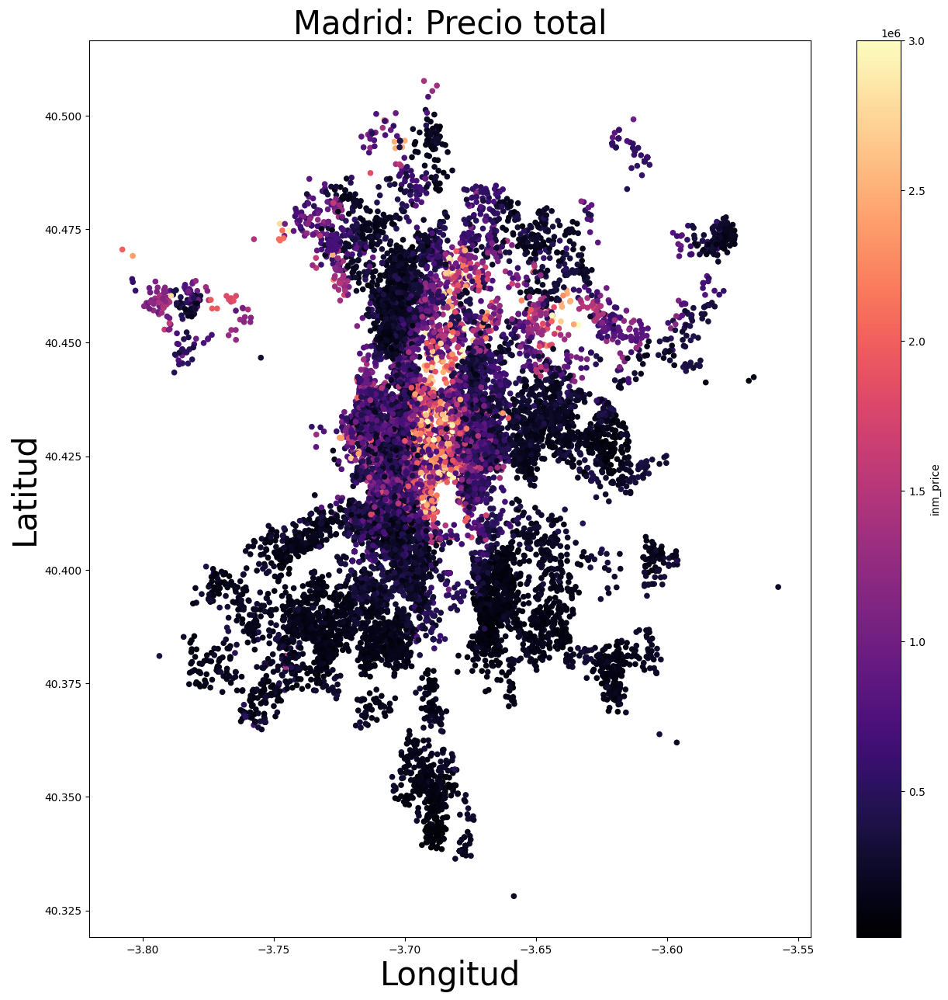

In [31]:
cm = plt.cm.get_cmap('magma') 

ax = df.plot.scatter(x='inm_longitude', 
                             y='inm_latitude', 
                             c='inm_price',
                             figsize=(15, 15), 
                             cmap=cm)
ax.set_xlabel('Longitud', fontsize=30)
ax.set_ylabel('Latitud', fontsize=30)
ax.set_title('Madrid: Precio total', fontsize=30)

Text(0.5, 1.0, 'Madrid: M2 price')

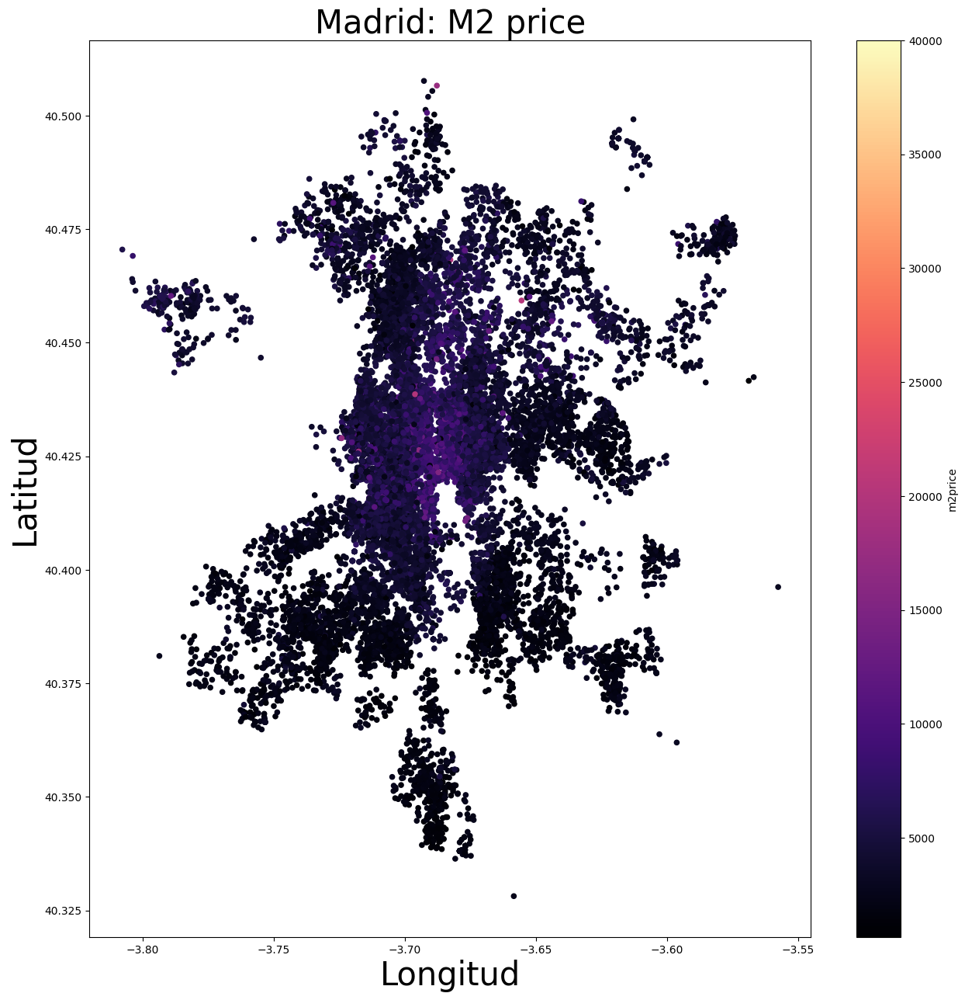

In [32]:

ax = df.plot.scatter(x='inm_longitude', 
                             y='inm_latitude', 
                             c='m2price',
                             figsize=(15, 15), 
                             cmap=cm)
ax.set_xlabel('Longitud', fontsize=30)
ax.set_ylabel('Latitud', fontsize=30)
ax.set_title('Madrid: M2 price', fontsize=30)

Both maps reveal a reality: longitude and latitude are vital when identifying prices! We can see that above 40.400 latitude and between -3.70 and -3.65 longitude, is the most sought after area to buy a flat in Madrid. For this reason, our model will take the longitude and latitude to study the physical space in which the property is located.

# 4 Models development

For this problem, I will use some tree algorithms, as I think they are the most suitable for this kind of challenges, in which location has much to say! I will use the following algorithms:
1 Random Forest: Good for regression tasks like housing price estimation due to its capacity to handle complex datasets and capture intricate patterns.

2 XGBoost (Extreme Gradient Boosting): Effective in addressing non-linear interactions and complex relationships, making it a robust choice for housing price prediction.

3 Decision Tree: Provides interpretability and captures non-linear relationships; when combined with ensemble techniques like Random Forest, it enhances predictive performance.

After that, I will use R2 in order to measure my results.
The R-squared statistic, also known as the coefficient of determination, measures the proportion of the variance in the dependent variable that is explained by the independent variables in a regression model.R² ranges from 0 to 1, where:
0 indicates that the model does not explain any variance in the target variable.
1 indicates that the model perfectly explains the variance in the target variable.

Once we've delved so much into our dataset, we can choose what variables to use. In this case, I wil use the PC1 and PC2 of the demographic variables, latitud, longitude, size, floor and the historic price.

I will not use the historic variation, as I feel I do not have the context to know exactly what does it mean.

In [33]:
from sklearn.model_selection import train_test_split

variables_independientes = ['PCA1', 'PCA2', 'inm_latitude', 'inm_longitude', 'inm_size', 'inm_floor', 'his_price']
variable_dependiente = 'inm_price'

# Crea un nuevo DataFrame con las variables seleccionadas
df_modelo = df[variables_independientes + [variable_dependiente]].copy()

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(df_modelo.drop(variable_dependiente, axis=1), df_modelo[variable_dependiente], 
                                                    test_size=0.33, 
                                                    random_state=40)

# Comprueba sus tamaños
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((10760, 7), (5301, 7), (10760,), (5301,))

In [34]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [35]:
def entrenar_modelo_y_predecir(modelo, X_train, X_test, y_train, y_test):
  """
  Función que entrena un modelo ya inicializado y evalua su calidad en el set
  de entrenamiento y de test, indicando la degradación en este.
  """
  # Entreno el árbol con el set de entrenamiento
  modelo = modelo.fit(X=X_train, y=y_train)
  # Uso el árbol para predecir sobre el dataset de entrenamiento
  y_pred_train = modelo.predict(X_train)
  # Uso el árbol para predecir sobre el dataset de test
  y_pred_test = modelo.predict(X_test)
  # Calidad predicción train
  ac_train = round(mean_squared_error(y_train, y_pred_train), 4)
  ac_train = np.sqrt(ac_train)
  print('Precisión en set de entrenamiento :', ac_train)
  # Calidad predicción test
  ac_test = round(mean_squared_error(y_test, y_pred_test), 4)
  ac_test = np.sqrt(ac_test)
  print('Precisión en set de test :', ac_test)
  # Degradación de la predicción
  print('Degradación: ' + str(round((ac_train-ac_test)/ac_train*100,2)) + '%') 
  print('R2: ' + str(round(r2_score(y_test, y_pred_test), 2)))

We carried out several tests with different hyperparameters with each of the algoritms

 Decision Tree

In [36]:
from sklearn import tree

modeloDT = tree.DecisionTreeRegressor(max_depth=10000,
                                    min_samples_split=5,
                                    min_samples_leaf = 50)

entrenar_modelo_y_predecir(modeloDT, X_train, X_test, y_train, y_test)

Precisión en set de entrenamiento : 219587.74857835763
Precisión en set de test : 221908.2667650741
Degradación: -1.06%
R2: 0.85


Random Forest

In [37]:
from sklearn import ensemble

modeloRF = ensemble.RandomForestRegressor(
    max_depth = 30,
    n_estimators = 200,
    min_samples_split = 30,
    min_samples_leaf = 20)

entrenar_modelo_y_predecir(modeloRF, X_train, X_test, y_train, y_test)

Precisión en set de entrenamiento : 199266.31780573682
Precisión en set de test : 206287.5218701284
Degradación: -3.52%
R2: 0.87


XGBoost

In [38]:
modeloXGB = XGBRegressor(
    n_estimators= 600, 
    learning_rate= 0.01, 
    max_depth= 4, 
    alpha= 0.1
    
)

# Entrenamos y predecimos con dicho modelo
entrenar_modelo_y_predecir(modeloXGB, X_train, X_test, y_train, y_test)

Precisión en set de entrenamiento : 199527.2318472937
Precisión en set de test : 202325.7506143064
Degradación: -1.4%
R2: 0.88


After experimenting with a range of hyperparameters, I obtained these results. It seems that all of our models work almost the same, with a R2, close to 90%, which means that 90% of the variance in the dependent variable is explained by the independent variables in the regression model, suggesting a strong fit and a high level of explanatory power.

We make a quick check of the importance of each variable.

In [39]:
print(modeloDT.feature_importances_)
print(modeloRF.feature_importances_)
print(modeloXGB.feature_importances_)

[7.07723535e-04 1.89444177e-04 4.98522247e-03 8.22755034e-03
 8.56118635e-01 1.61123692e-03 1.28160188e-01]
[0.0045124  0.00199014 0.00951142 0.01343477 0.82757397 0.00730221
 0.13567509]
[0.02358273 0.01187209 0.02459687 0.02101556 0.7219353  0.02544365
 0.17155388]


Los resultados son claros: hay dos variables vitales para predecir el precio: inm_size y historic price!

# 5 Results analysis

We will do a residual analysis

In [40]:
y_pred1 = modeloDT.predict(X_test)
y_pred2 = modeloRF.predict(X_test)
y_pred = modeloXGB.predict(X_test)

In [41]:
residuos1 = y_test - y_pred1
residuos2 = y_test - y_pred2
residuos = y_test - y_pred

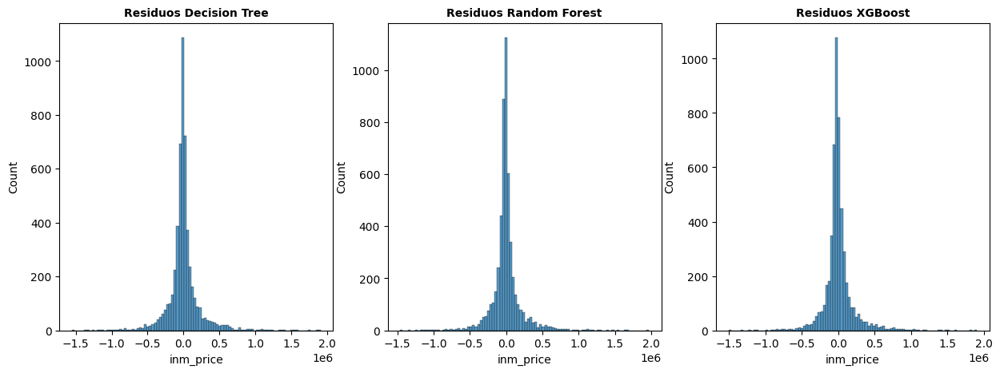

In [42]:
f, axes = plt.subplots(1, 3, figsize=(15, 5))  # Ajusté el tamaño de la figura

sns.histplot(residuos1, bins=100, ax=axes[0])
axes[0].set_title('Residuos Decision Tree', fontweight='bold', color='black', fontsize=10)

sns.histplot(residuos2, bins=100, ax=axes[1])
axes[1].set_title('Residuos Random Forest', fontweight='bold', color='black', fontsize=10)

sns.histplot(residuos, bins=100, ax=axes[2])
axes[2].set_title('Residuos XGBoost', fontweight='bold', color='black', fontsize=10)

plt.show()

A consistent distribution of residuals implies that the model's predictions exhibit uniform variability across all possible prediction magnitudes. This indicates the absence of a systematic pattern in the differences between model predictions and actual values as prediction magnitudes change. Such constancy suggests that the model is unbiased, effectively capturing relationships in the data without systematically overestimating or underestimating in specific ranges. In summary, a consistent distribution of residuals signifies a well-fitted model without systematic biases in predictions. Those results are pretty good

In [43]:
print('Media de los residuos DT: ' + str(round((np.mean(np.abs(residuos1))),2))) 
print('Media de los residuos RF: ' + str(round((np.mean(np.abs(residuos2))),2))) 
print('Media de los residuos XGB: ' + str(round((np.mean(np.abs(residuos))),2))) 


Media de los residuos DT: 126512.37
Media de los residuos RF: 115519.14
Media de los residuos XGB: 115796.7


In [44]:
print('Mediana de los residuos DT: ' + str(round((np.median(np.abs(residuos1))),2))) 
print('Mediana de los residuos RF: ' + str(round((np.median(np.abs(residuos2))),2))) 
print('Mediana de los residuos XGB: ' + str(round((np.median(np.abs(residuos))),2))) 

Mediana de los residuos DT: 59131.87
Mediana de los residuos RF: 53184.54
Mediana de los residuos XGB: 57412.5


The median represents the central tendency of the residuals' distribution, indicating the typical magnitude of the prediction errors. A lower median suggests that, on average, the model's predictions are closer to the actual values. Comparing these medians provides insights into the models' performance, with RF having the lowest median, implying potentially better predictive accuracy compared to DT and XGB

In [45]:
#creamos los dataframes añadiendo la columna residuos para cada uno de los modelos

df_con_residuos = df.copy()
df_con_residuos["residuosDT"] = residuos1
df_con_residuos["residuosDT_abs"] = abs(residuos1)

df_con_residuos2 = X_test.copy()
df_con_residuos["residuosRF"] = residuos2
df_con_residuos["residuosRF_abs"] = abs(residuos2)

df_con_residuos4 = X_test.copy()
df_con_residuos["residuos"] = residuos
df_con_residuos["residuos_abs"] = abs(residuos)


In [46]:
df_con_residuos.shape

(16061, 31)

*Residuals by neihbourhood*

We will count the number of observations with extreme residuals in each neighbourhood, filtering out observations that have absolute residuals larger than the absolute average of all residuals.

In [47]:
condicion = (df_con_residuos['residuos_abs'] > (np.mean(np.abs(residuos))))
residuos_extremos = df_con_residuos[condicion]

# Count the occurrences of each neighborhood
neighborhood_counts = residuos_extremos['inm_barrio'].value_counts()

# Print the results ordered by size
for neighborhood, count in neighborhood_counts.items():
    print(f"{neighborhood} = {count}")

Embajadores = 162
Almagro = 78
Goya = 72
Recoletos = 67
Justicia = 67
Castellana = 65
Lista = 61
Universidad = 59
El Viso = 57
Palacio = 48
Argüelles = 43
Nueva España = 36
Cortes = 29
Jerónimos = 29
Trafalgar = 29
Sol = 28
Rios Rosas = 25
Aravaca = 24
Piovera = 23
Castilla = 22
Ciudad Jardín = 22
Gaztambide = 22
Guindalera = 20
San Juan Bautista = 20
Arapiles = 20
Hispanoamérica = 19
Cuatro Caminos = 18
Castillejos = 17
Ciudad Universitaria = 17
Canillas = 16
Vallehermoso = 15
Ibiza = 15
Imperial = 13
Valdeacederas = 12
Peñagrande = 12
San Isidro = 11
Niño Jesús = 11
San Pascual = 10
Prosperidad = 10
Costillares = 8
Delicias = 8
Mirasierra = 8
Palomas = 7
Vista Alegre = 7
Berruguete = 7
Almenara = 7
Bellas Vistas = 6
Valdezarza = 6
Canillejas = 6
Fuente del Berro = 5
Pinar del Rey = 5
Salvador = 5
La Paz = 5
Palos de Moguer = 5
Valdefuentes = 5
Alameda de Osuna = 5
Puerta del Ángel = 5
Media Legua = 4
Adelfas = 4
Almendrales = 4
Pueblo Nuevo = 4
Concepción = 4
San Diego = 4
Apostol Sa

Text(0.5, 1.0, 'Mapa de los residuos absolutos de Madrid')

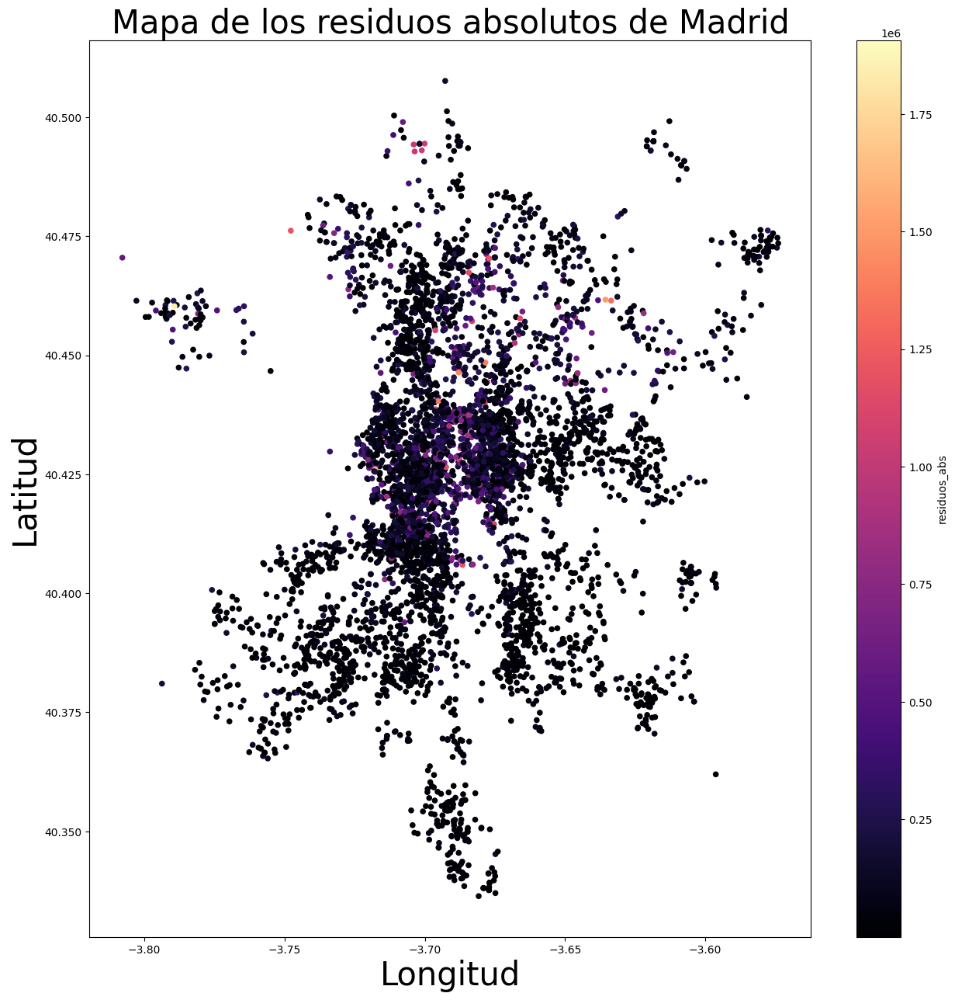

In [48]:
ax = df_con_residuos.plot.scatter(x='inm_longitude', 
                             y='inm_latitude', 
                             c='residuos_abs',
                             figsize=(15, 15), 
                             cmap=cm)
ax.set_xlabel('Longitud', fontsize=30)
ax.set_ylabel('Latitud', fontsize=30)
ax.set_title('Mapa de los residuos absolutos de Madrid', fontsize=30)

This model is failing especially in the central neighbourhoods, with Embajadores being the neighbourhood where most failures occur! We have to take into account that many of the nulls in size (one of the most relevant variables) were in Embajadores and that it was filled with the median of the neighbourhood. With more data, perhaps it would have been better to delete the data.

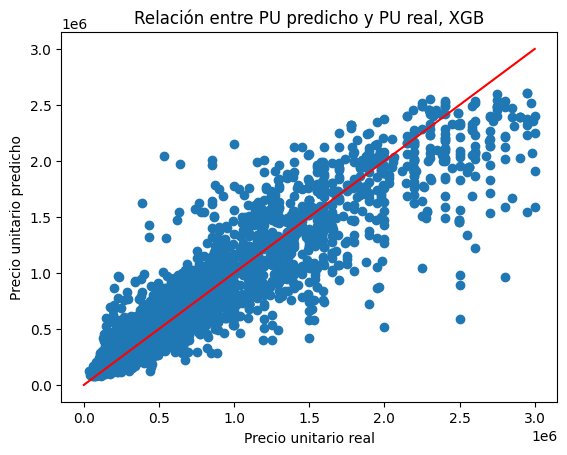

In [49]:
plt.scatter(y_test, y_pred)
plt.plot([0,3000000],[0,3000000], color = "red")
plt.title('Relación entre PU predicho y PU real, XGB')
plt.xlabel('Precio unitario real')
plt.ylabel('Precio unitario predicho')
plt.show()

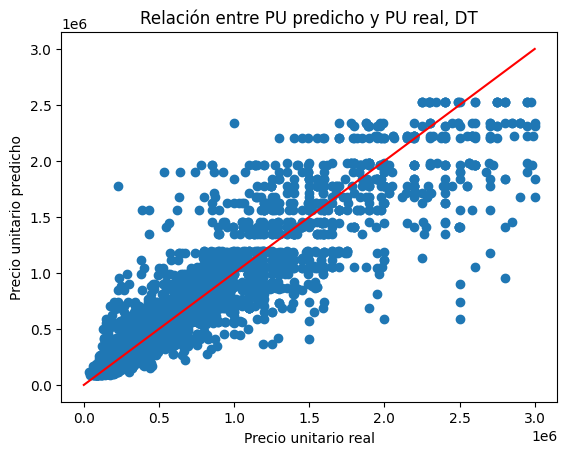

In [50]:
plt.scatter(y_test, y_pred1)
plt.plot([0,3000000],[0,3000000], color = "red")
plt.title('Relación entre PU predicho y PU real, DT')
plt.xlabel('Precio unitario real')
plt.ylabel('Precio unitario predicho')
plt.show()

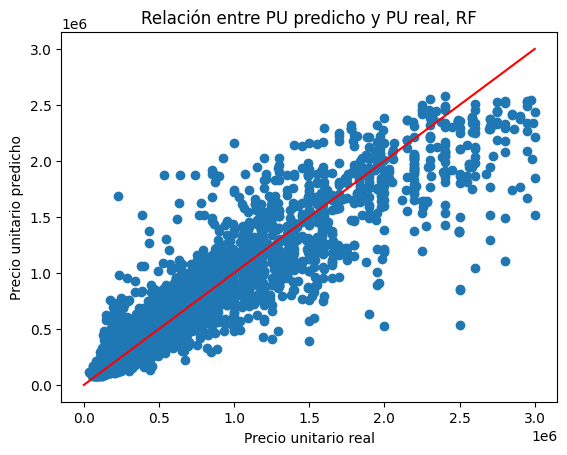

In [51]:
plt.scatter(y_test, y_pred2)
plt.plot([0,3000000],[0,3000000], color = "red")
plt.title('Relación entre PU predicho y PU real, RF')
plt.xlabel('Precio unitario real')
plt.ylabel('Precio unitario predicho')
plt.show()

The model is wrong at the top. This is normal, since if we remember the distribution of the target variable, it was unbalanced to the left, with few records of prices above one million euros.

In [52]:
medianas_residuos = df_con_residuos.groupby(['inm_barrio'])['residuos_abs'].median()
medias_residuos = df_con_residuos.groupby(['inm_barrio'])['residuos_abs'].mean()
medias_residuos.sort_values(ascending = True)

inm_barrio
Vinateros                       16155.728125
Casco Histórico de Vallecas     22051.461483
Fontarrón                       24855.490885
Numancia                        25935.952257
Pradolongo                      26082.922917
                                   ...      
Piovera                        296386.945312
El Viso                        312532.852113
El Plantío                     329987.093750
Jerónimos                      335645.585503
Mirasierra                     429739.162260
Name: residuos_abs, Length: 114, dtype: float64

In [53]:
medianas_residuos.sort_values(ascending = True)

inm_barrio
Vinateros                        8639.750000
Valdebernardo                   11857.890625
Pavones                         14366.312500
Numancia                        15773.421875
Casco Histórico de Vallecas     18085.046875
                                   ...      
Mirasierra                     201467.343750
El Viso                        207713.000000
Nueva España                   227367.875000
Jerónimos                      271669.812500
El Plantío                     329987.093750
Name: residuos_abs, Length: 114, dtype: float64

# MAPE

The Mean Absolute Percentage Error (MAPE) is a metric used to assess the accuracy of a predictive model by measuring the percentage difference between the predicted and actual values. It provides a relative measure of the magnitude of errors, taking into account the scale of the data. MAPE is expressed as a percentage and is particularly useful when dealing with data with varying scales or units. A lower MAPE indicates better predictive accuracy, as it signifies a smaller average percentage deviation between predicted and actual values. This metric is commonly employed in forecasting and regression analysis to evaluate the performance of models in real-world applications.

In [54]:
df_mape = df_con_residuos.copy()

In [55]:
df_mape['APE'] = df_con_residuos.residuos_abs / df_con_residuos.inm_price

In [56]:
medias_MAPE = df_mape.groupby(['inm_barrio'])['APE'].mean()

In [57]:
residuo_precio_barrio = pd.merge(medias_MAPE,medias_residuos,on='inm_barrio',how='outer')

In [58]:
residuo_precio_barrio.head(15).sort_values(by = 'APE', ascending = True)

,APE,residuos_abs
inm_barrio,,
Almagro,0.163346,222714.560059
Acacias,0.165617,61027.155253
Almendrales,0.178975,41118.181704
Arapiles,0.190598,109557.716264
Alameda de Osuna,0.198040,97250.062500
Aluche,0.215290,39049.067434
Aravaca,0.216832,177353.394189
Abrantes,0.224806,35437.451297
Almenara,0.239311,78368.486779


In [59]:
print('Mean Average Percentage Error: ' + str(round(medias_MAPE.mean(),2))) 

Mean Average Percentage Error: 0.23


# Variable Interpretability: Shap Values

In [60]:
import shap

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


[08:43:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


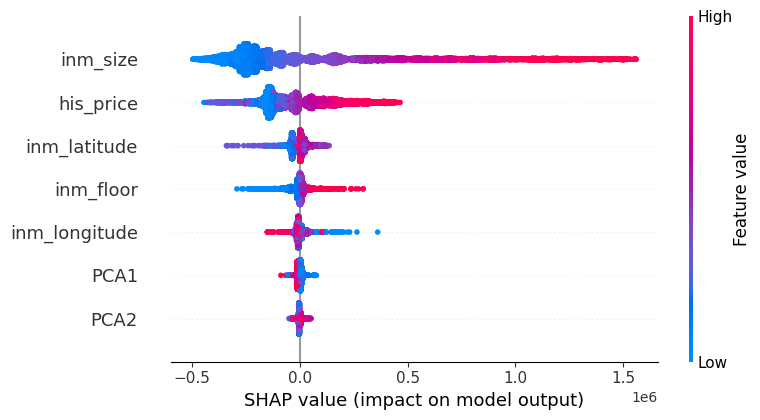

In [61]:

X_features = df_modelo.drop(variable_dependiente, axis=1)

# Crear un objeto TreeExplainer y calcular los valores SHAP solo para la variable dependiente
explainer = shap.TreeExplainer(modeloXGB)
shap_values = explainer.shap_values(X_features)

# Visualizar los valores SHAP para una observación específica
shap.summary_plot(shap_values, X_features)


SHAP is a technique that provides a detailed explanation of the predictions of a machine learning model, breaking down the contribution of each individual feature to each prediction. By interpreting SHAP results, you can understand how each feature affects the model's prediction.

In this case, the following is explained:
First, the size effect is very large, as expected. If you look at it, the positive effect of very large flats is larger than the negative effect of smaller flats, even though there are more of them. That is, if a flat is very large, it is almost certainly going to be expensive, whereas if it is small, the price will not necessarily drop that much.
The relationship with the historian is neutral. It has quite an effect in both directions, but of equal intensity, whether larger or smaller.
As for latitude, it confirms that it is more expensive in the north, while longitude reveals that the fact that the flat is in the east makes it potentially more expensive than in the west.

Save as a pickle

In [62]:
import pickle 
filename = 'modelo.pkl'
pickle.dump(modeloXGB, open(filename, "wb"))

In [63]:
modelo_filename = 'modelo.pkl'
loaded_model = pickle.load(open(modelo_filename, 'rb'))

# Conclusion

In this project, we assessed the performance of tree-based models, specifically XGBoost (XGB), Random Forest (RF), and Decision Trees (DT), in the context of real estate price estimation. Our findings indicate that these models are suitable for addressing regression tasks in the real estate domain, providing meaningful and valuable predictions.

However, we identified areas for improvement that could further refine the predictive capability of the model. We noted that the models exhibit limitations in estimating prices for properties with significantly high values. This discrepancy is explained by the skewed distribution of the dataset toward lower values, suggesting the possibility of considering data normalization or managing outliers to enhance accuracy in higher price ranges.

PCA, while it may have strengths, does not necessarily guarantee a substantial improvement in this context. This suggests that the dimensionality reduction offered by PCA may not have effectively captured the critical variations for the real estate price prediction task.

Furthermore, we observed that filling missing housing size values in the Embajadores neighborhood with the mean might have negatively impacted the model's performance in this specific area. This aspect highlights the importance of careful handling of missing data to avoid biases in estimation.

We emphasize the vitality of size and location variables in estimating housing prices. Proper consideration of location and management of size-related variables are critical to improving the model's prediction quality.

Regarding future developments, we suggest exploring normalization techniques and implementing specific strategies to handle outliers in the preprocessing phase. Additionally, the creation of an interactive program based on Streamlit that allows users to make housing price predictions based on the model could provide a practical and accessible tool for real estate decision-making.

In conclusion, this project provides a solid foundation for the implementation of predictive models in the real estate sector, underscoring the importance of addressing specific challenges and carefully considering dataset characteristics to achieve more accurate and useful results.